# Test 1; best case scenario

import packages

In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import logging
import os
import pathlib
import pickle
import string

import geopandas as gpd
import numpy as np
import scipy as sp
import shapely
import verde as vd
import xarray as xr
from polartoolkit import fetch, maps, profiles
from polartoolkit import utils as polar_utils

import synthetic_bathymetry_inversion.plotting as synth_plotting
from synthetic_bathymetry_inversion import synthetic

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import inversion, plotting, regional, uncertainty, utils

/home/mattd/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/esmpy/interface/loadESMF.py:94: VersionWarning:

ESMF installation version 8.8.0, ESMPy version 8.8.0b0



In [2]:
fpath = "../results/Ross_Sea/Ross_Sea_01"

# Get synthetic model data

INFO:polartoolkit:converting to be reference to the WGS84 ellipsoid
INFO:polartoolkit:spacing larger than original, filtering and resampling
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


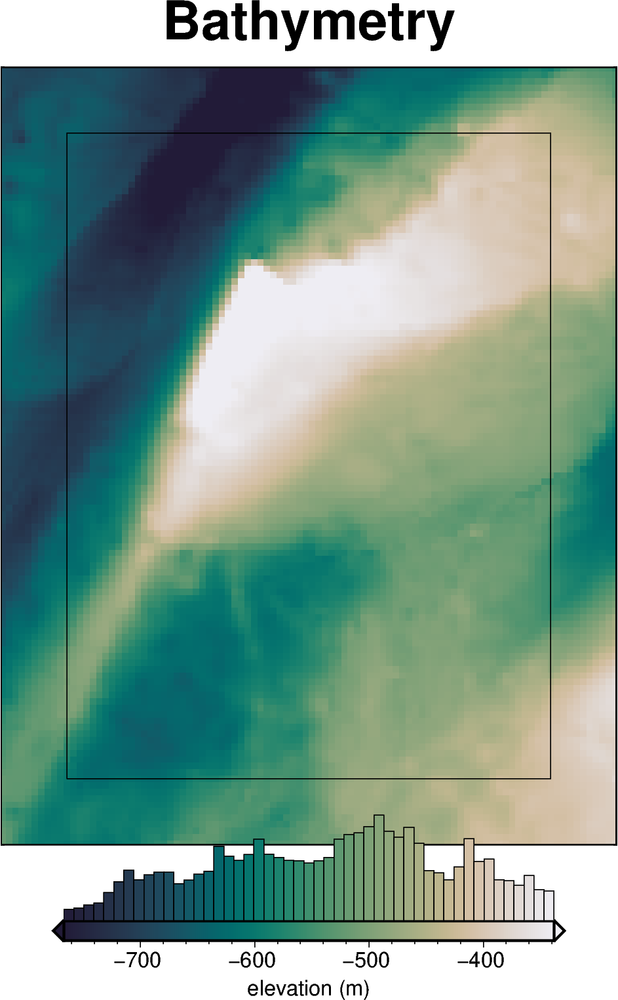

  0%|          | 0/7676 [00:00<?, ?it/s]

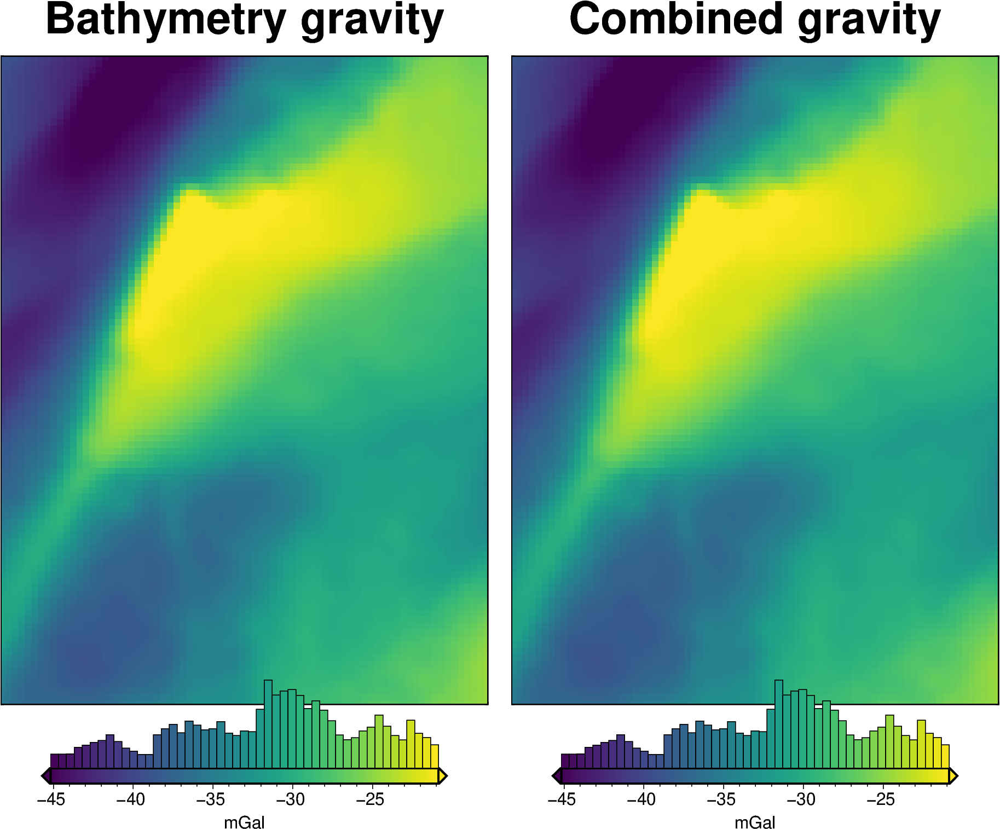

In [3]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = synthetic.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

In [4]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly
0,-1600000.0,-40000.0,1000.0,-35.551041,0,-35.551041,-35.551041
1,-1600000.0,-38000.0,1000.0,-36.054652,0,-36.054652,-36.054652
2,-1600000.0,-36000.0,1000.0,-36.473148,0,-36.473148,-36.473148
3,-1600000.0,-34000.0,1000.0,-36.755612,0,-36.755612,-36.755612
4,-1600000.0,-32000.0,1000.0,-36.951032,0,-36.951032,-36.951032


# Make starting bathymetry model

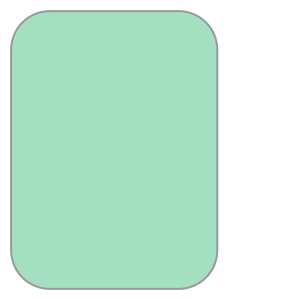

In [5]:
df = polar_utils.region_to_df(inversion_region)
gdf = gpd.GeoDataFrame(
    index=[0],
    geometry=[shapely.geometry.Polygon(zip(df.x, df.y))],
)
polygon = gdf.geometry.envelope.buffer(-30e3).buffer(27e3)
polygon.to_file("../results/Ross_Sea_outline.shp")
polygon.iloc[0]

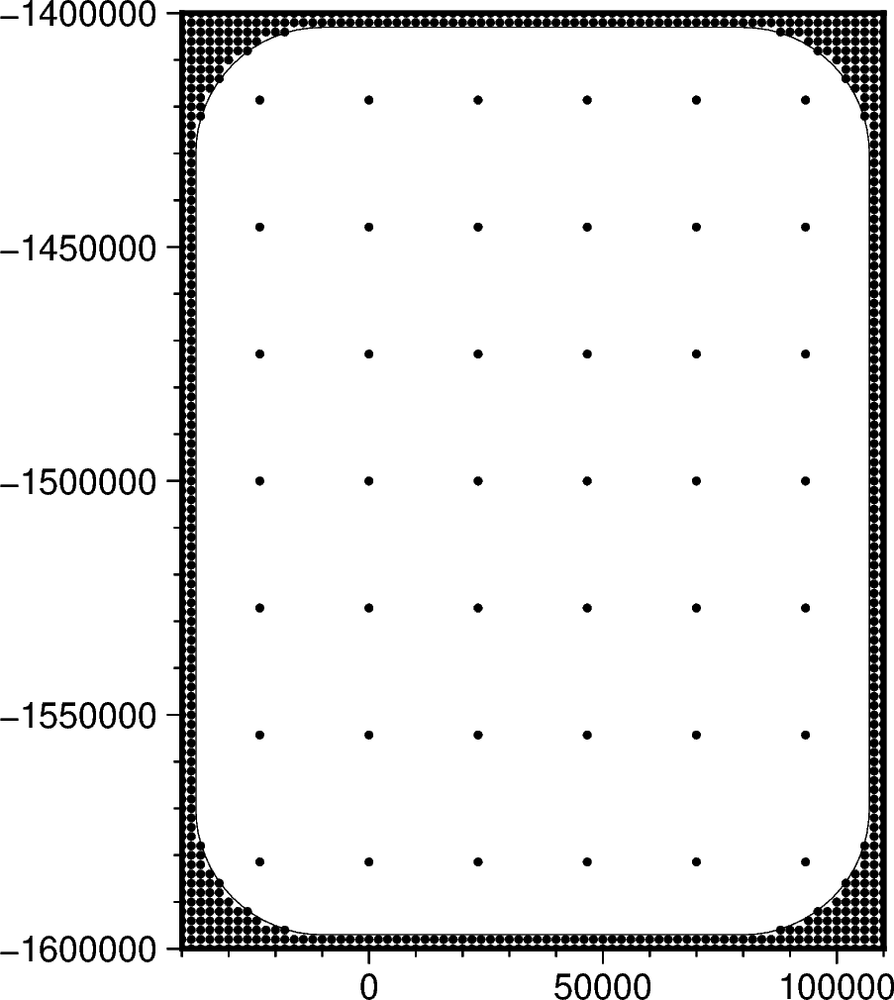

,northing,easting,inside,true_upward,upward
0,-1.600000e+06,-4.000000e+04,False,-601.093811,-601.093811
1,-1.600000e+06,-3.800000e+04,False,-609.216797,-609.216797
2,-1.600000e+06,-3.600000e+04,False,-616.356018,-616.356018
3,-1.600000e+06,-3.400000e+04,False,-621.262207,-621.262207
4,-1.600000e+06,-3.200000e+04,False,-625.510864,-625.510864
...,...,...,...,...,...
881,-1.418571e+06,-3.637979e-12,True,-747.305404,-747.305404
882,-1.418571e+06,2.333333e+04,True,-619.672029,-619.672029
883,-1.418571e+06,4.666667e+04,True,-505.761627,-505.761627
884,-1.418571e+06,7.000000e+04,True,-447.753376,-447.753376


In [6]:
# semi-regularly spaced
constraint_points = synthetic.constraint_layout_number(
    # shape=(4, 5),
    shape=(6, 7),
    region=inversion_region,
    padding=-spacing,
    shapefile="../results/Ross_Sea_outline.shp",
    add_outside_points=True,
    grid_spacing=spacing,
    plot=True,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward
constraint_points

In [7]:
# calculate average constraint spacing
df = constraint_points[constraint_points.inside]
constraint_spacing = (
    np.median(
        vd.median_distance(
            (df.easting, df.northing),
            k_nearest=1,
        )
    )
    / 1e3
)

# inversion_area =  (
#     (inversion_region[1] - inversion_region[0])
#     / 1e3
#     * (inversion_region[3] - inversion_region[2])
#     /1e3
# )

# # calculate number of constraints per 10000 sq km
# constraints_per_10000sq_km = (
#     len(constraint_points) / inversion_area
# ) * 10e3

# # calculate sq km for each constraint
# constraints_density = 1/ (len(constraint_points) / inversion_area)

print(f"Constraint spacing: {constraint_spacing} km")
# print(f"Constraints per 10,000 sq km: {constraints_per_10000sq_km}")
# print(f"Constraints density: {constraints_density}")

Constraint spacing: 23.333333333333332 km


In [40]:
# calculate gravity data median distance
grd = bathymetry.sel(
    easting=slice(*inversion_region[:2]), northing=slice(*inversion_region[2:])
)
grd = fetch.resample_grid(grd, spacing=100, verbose="q").rename(
    {"x": "easting", "y": "northing"}
)

min_dist = utils.dist_nearest_points(
    constraint_points,
    grd,
).min_dist

mean_proximity = min_dist.mean().values
median_proximity = min_dist.median().values
max_proximity = min_dist.max().values
print(f"mean constraint proximity: {int(mean_proximity)} m")
print(f"median constraint proximity: {int(median_proximity)} m")
print(f"maximum constraint proximity: {int(max_proximity)} m")

print(f"max/mean ratio: {round((max_proximity/mean_proximity),3)}")
print(f"max_median/ ratio: {round((max_proximity/median_proximity),3)}")

print(f"Skewness: {round(sp.stats.skew(min_dist.values.ravel(), nan_policy="omit"),4)}")

mean constraint proximity: 7813 m
median constraint proximity: 7978 m
maximum constraint proximity: 17885 m
max/mean ratio: 2.289
max_median/ ratio: 2.242
Skewness: -0.0402


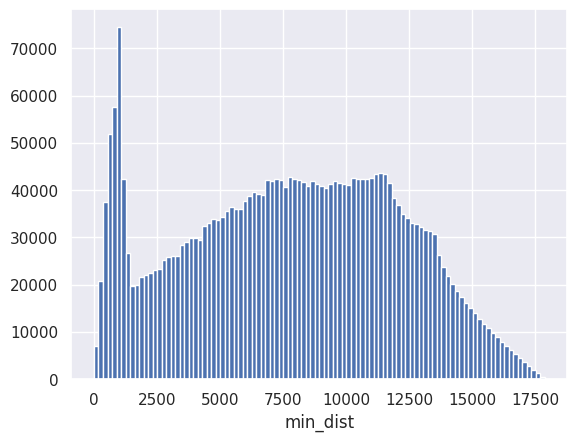

In [42]:
_ = min_dist.plot.hist(bins=100)

In [43]:
# mask to the ice shelf outline
min_dist = polar_utils.mask_from_shp(
    shapefile="../results/Ross_Sea_outline.shp",
    xr_grid=min_dist,
    invert=False,
    masked=True,
)

mean_proximity = min_dist.mean().values
median_proximity = min_dist.median().values
max_proximity = min_dist.max().values
print(f"mean constraint proximity: {int(mean_proximity)} m")
print(f"median constraint proximity: {int(median_proximity)} m")
print(f"maximum constraint proximity: {int(max_proximity)} m")

print(f"max/mean ratio: {round((max_proximity/mean_proximity),3)}")
print(f"max_median/ ratio: {round((max_proximity/median_proximity),3)}")

print(f"Skewness: {round(sp.stats.skew(min_dist.values.ravel(), nan_policy="omit"),4)}")

mean constraint proximity: 8516 m
median constraint proximity: 8557 m
maximum constraint proximity: 17885 m
max/mean ratio: 2.1
max_median/ ratio: 2.09
Skewness: 0.0043


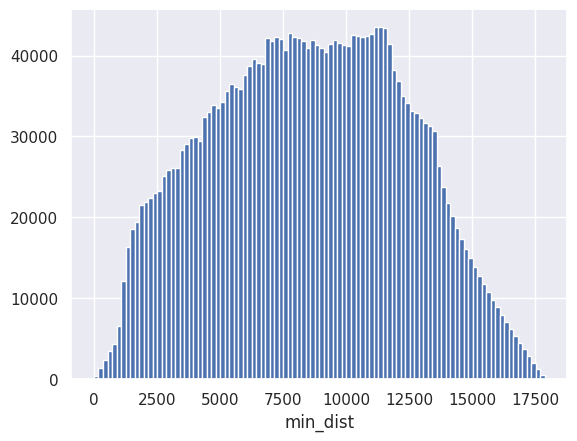

In [46]:
_ = min_dist.plot.hist(bins=100)

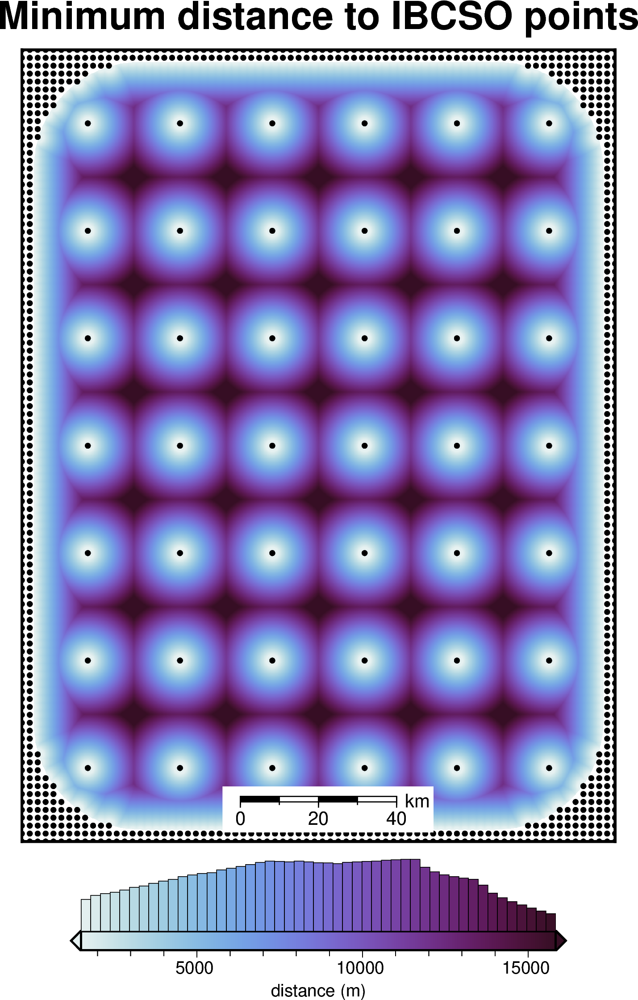

In [39]:
fig = maps.plot_grd(
    min_dist,
    region=inversion_region,
    title="Minimum distance to IBCSO points",
    cbar_label="distance (m)",
    cmap="dense",
    hist=True,
    robust=True,
    points=constraint_points,
    points_style="c2p",
    points_fill="black",
    scalebar=True,
)
fig.show()

In [13]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)
starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 121, easting: 96)> Size: 93kB
array([[-541.24376755, -544.57145531, -547.9225961 , ..., -360.00002858,
        -357.06763298, -354.19952961],
       [-543.34365605, -546.81640128, -550.35222195, ..., -362.90249581,
        -359.9686979 , -357.11426815],
       [-545.05496589, -548.66001144, -552.37483947, ..., -365.66133988,
        -362.73264883, -359.9004747 ],
       ...,
       [-591.95330237, -595.51878249, -599.06866787, ..., -440.89364102,
        -440.6949685 , -440.40606698],
       [-590.53129824, -594.09072644, -597.6407624 , ..., -440.69206448,
        -440.42575788, -440.07250027],
       [-589.16627633, -592.73500682, -596.30206449, ..., -440.51808973,
        -440.17189745, -439.74486709]])
Coordinates:
  * easting   (easting) float64 768B -6e+04 -5.8e+04 ... 1.28e+05 1.3e+05
  * northing  (northing) float64 968B -1.62e+06 -1.618e+06 ... -1.38e+06
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [14]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.starting_bathymetry)
print(f"RMSE: {rmse:.2f} m")

RMSE: 0.03 m


In [15]:
constraint_points

,northing,easting,inside,true_upward,upward,starting_bathymetry
0,-1.600000e+06,-4.000000e+04,False,-601.093811,-601.093811,-601.093811
1,-1.600000e+06,-3.800000e+04,False,-609.216797,-609.216797,-609.216797
2,-1.600000e+06,-3.600000e+04,False,-616.356018,-616.356018,-616.356018
3,-1.600000e+06,-3.400000e+04,False,-621.262207,-621.262207,-621.262207
4,-1.600000e+06,-3.200000e+04,False,-625.510864,-625.510864,-625.510864
...,...,...,...,...,...,...
881,-1.418571e+06,-3.637979e-12,True,-747.305404,-747.305404,-747.288886
882,-1.418571e+06,2.333333e+04,True,-619.672029,-619.672029,-619.459731
883,-1.418571e+06,4.666667e+04,True,-505.761627,-505.761627,-505.739907
884,-1.418571e+06,7.000000e+04,True,-447.753376,-447.753376,-447.783133


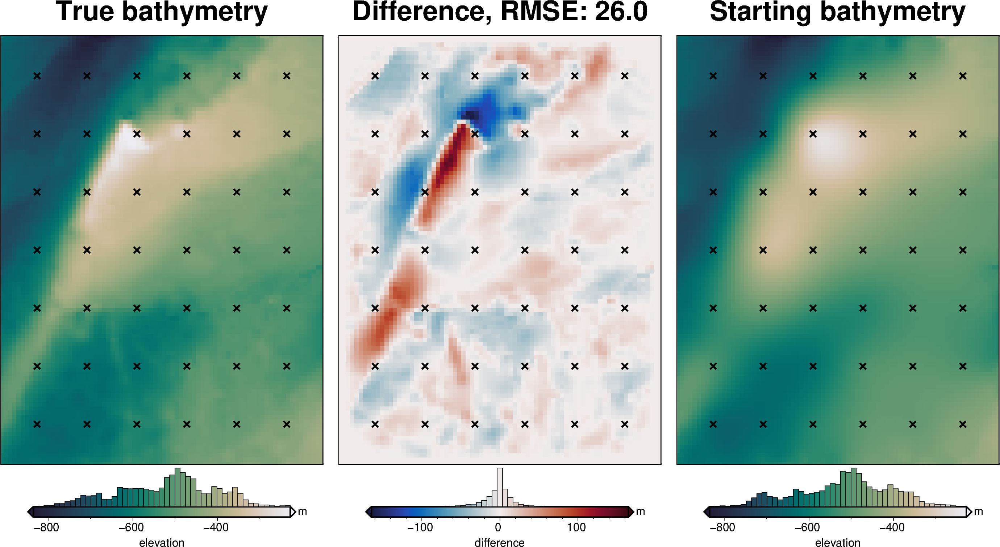

In [16]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    plot_type="pygmt",
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    label_font="16p,Helvetica,black",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [17]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350

# set the reference level from the prisms to 0
zref = 0

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/7676 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly,starting_gravity
0,-1600000.0,-40000.0,1000.0,-35.551041,0,-35.551041,-35.551041,-32.541358
1,-1600000.0,-38000.0,1000.0,-36.054652,0,-36.054652,-36.054652,-32.965825
2,-1600000.0,-36000.0,1000.0,-36.473148,0,-36.473148,-36.473148,-33.347646
3,-1600000.0,-34000.0,1000.0,-36.755612,0,-36.755612,-36.755612,-33.644493
4,-1600000.0,-32000.0,1000.0,-36.951032,0,-36.951032,-36.951032,-33.840061
...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0,-25.760380,-25.760380,-23.321507
7672,-1400000.0,104000.0,1000.0,-25.911731,0,-25.911731,-25.911731,-23.482119
7673,-1400000.0,106000.0,1000.0,-26.033127,0,-26.033127,-26.033127,-23.605606
7674,-1400000.0,108000.0,1000.0,-26.122232,0,-26.122232,-26.122232,-23.693176


In [18]:
regional_grav_kwargs = dict(
    method="constant",
    # constant=0,
    constraints_df=constraint_points,
)
grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

grav_df

INFO:invert4geom:using median gravity misfit of constraint points for regional field: -2.91951584815979 mGal


,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly,starting_gravity,misfit,reg,res
0,-1600000.0,-40000.0,1000.0,-35.551041,0,-35.551041,-35.551041,-32.541358,-3.009683,-2.919516,-0.090167
1,-1600000.0,-38000.0,1000.0,-36.054652,0,-36.054652,-36.054652,-32.965825,-3.088827,-2.919516,-0.169311
2,-1600000.0,-36000.0,1000.0,-36.473148,0,-36.473148,-36.473148,-33.347646,-3.125503,-2.919516,-0.205987
3,-1600000.0,-34000.0,1000.0,-36.755612,0,-36.755612,-36.755612,-33.644493,-3.111119,-2.919516,-0.191603
4,-1600000.0,-32000.0,1000.0,-36.951032,0,-36.951032,-36.951032,-33.840061,-3.110972,-2.919516,-0.191456
...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760380,0,-25.760380,-25.760380,-23.321507,-2.438873,-2.919516,0.480643
7672,-1400000.0,104000.0,1000.0,-25.911731,0,-25.911731,-25.911731,-23.482119,-2.429612,-2.919516,0.489904
7673,-1400000.0,106000.0,1000.0,-26.033127,0,-26.033127,-26.033127,-23.605606,-2.427521,-2.919516,0.491995
7674,-1400000.0,108000.0,1000.0,-26.122232,0,-26.122232,-26.122232,-23.693176,-2.429056,-2.919516,0.490460


makecpt [ERROR]: Option T: min >= max


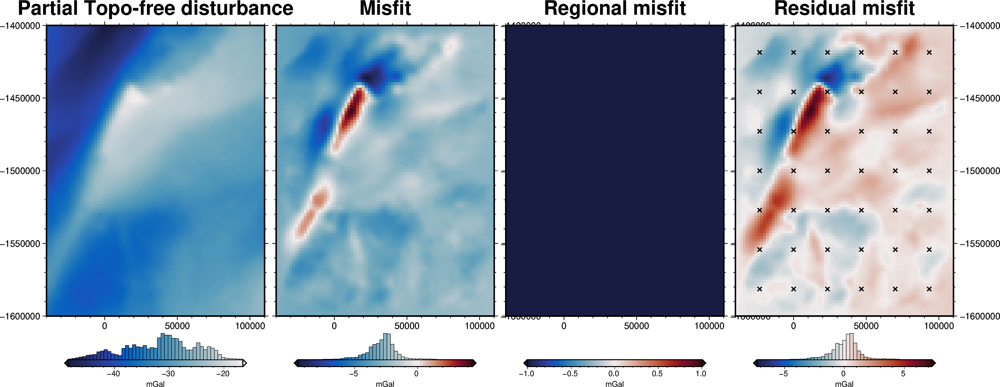

In [19]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

In [20]:
# # calculate the distance between each grid cell and the nearest constraint, then
# # normalize those values between 0 and 1
# weighting_grid = utils.normalized_mindist(
#     constraint_points,
#     starting_prisms,
#     low=0,
#     high=1,
# )
# weighting_grid.plot()

In [21]:
# # set kwargs to pass to the inversion
# kwargs = {
#     # set stopping criteria
#     "max_iterations": 200,
#     "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
#     "delta_l2_norm_tolerance": 1.02,
#     "apply_weighting_grid": True,
#     "weighting_grid": weighting_grid,
# }

# logging.getLogger().setLevel(logging.INFO)

# # run the inversion workflow, including a cross validation for the damping parameter
# results = inversion.run_inversion_workflow(
#     grav_df=grav_df,
#     starting_prisms=starting_prisms,
#     plot_dynamic_convergence=True,
#     **kwargs,
# )

# # collect the results
# topo_results, grav_results, parameters, elapsed_time = results

In [22]:
# plotting.plot_inversion_results(
#     grav_results,
#     topo_results,
#     parameters,
#     inversion_region,
#     iters_to_plot=2,
#     plot_iter_results=True,
#     plot_topo_results=True,
#     plot_grav_results=True,
# )

# final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

# _ = polar_utils.grd_compare(
#     bathymetry,
#     final_topography,
#     region=inversion_region,
#     plot=True,
#     grid1_name="True topography",
#     grid2_name="Inverted topography",
#     robust=True,
#     hist=True,
#     inset=False,
#     verbose="q",
#     title="difference",
#     grounding_line=False,
#     reverse_cpt=True,
#     cmap="rain",
#     points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
# )

In [23]:
# # set kwargs to pass to the inversion
# kwargs = {
#     # set stopping criteria
#     "max_iterations": 200,
#     "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
#     "delta_l2_norm_tolerance": 1.02,
#     # "apply_weighting_grid": True,
#     # "weighting_grid": weighting_grid,
# }

# logging.getLogger().setLevel(logging.INFO)

# # run the inversion workflow, including a cross validation for the damping parameter
# results = inversion.run_inversion_workflow(
#     grav_df=grav_df,
#     starting_prisms=starting_prisms,
#     plot_dynamic_convergence=True,
#     **kwargs,
# )

# # collect the results
# topo_results, grav_results, parameters, elapsed_time = results

# plotting.plot_inversion_results(
#     grav_results,
#     topo_results,
#     parameters,
#     inversion_region,
#     iters_to_plot=2,
#     plot_iter_results=True,
#     plot_topo_results=True,
#     plot_grav_results=True,
# )

# final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

# _ = polar_utils.grd_compare(
#     bathymetry,
#     final_topography,
#     region=inversion_region,
#     plot=True,
#     grid1_name="True topography",
#     grid2_name="Inverted topography",
#     robust=True,
#     hist=True,
#     inset=False,
#     verbose="q",
#     title="difference",
#     grounding_line=False,
#     reverse_cpt=True,
#     cmap="rain",
#     points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
#     points_style="x.2c",
# )

In [24]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
    # "delta_l2_norm_tolerance": 1.02,
    # "apply_weighting_grid": True,
    # "weighting_grid": weighting_grid,
}

# Damping Cross Validation

In [25]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    # damping_limits=(1e-20, 1e-5),
    # damping_cv_trials=6,
    # plot_cv=True,
    fname=f"{fpath}_damping_cv",
    **kwargs,
)

INFO:invert4geom:saving all results with root name '../results/Ross_Sea_01_damping_cv'
INFO:invert4geom:running damping cross validation
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 6
INFO:invert4geom:	parameter: {'damping': 0.014002832042252177}
INFO:invert4geom:	scores: [0.01562809124164931]
INFO:invert4geom:results saved to ../results/Ross_Sea_01_damping_cv_results.pickle.pickle


In [26]:
# load saved inversion results
with pathlib.Path(f"{fpath}_damping_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [27]:
best_damping = parameters.get("Solver damping")
kwargs["solver_damping"] = best_damping
best_damping

0.014002832042252177

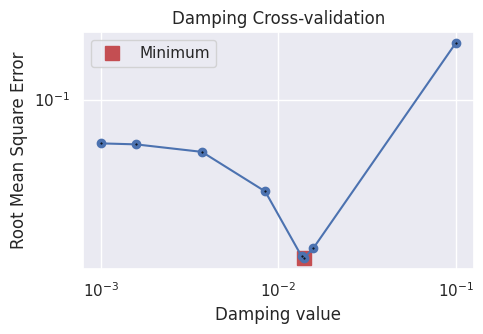

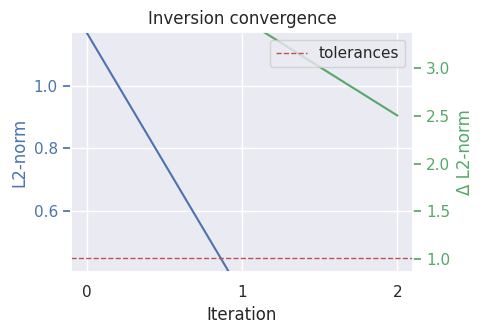

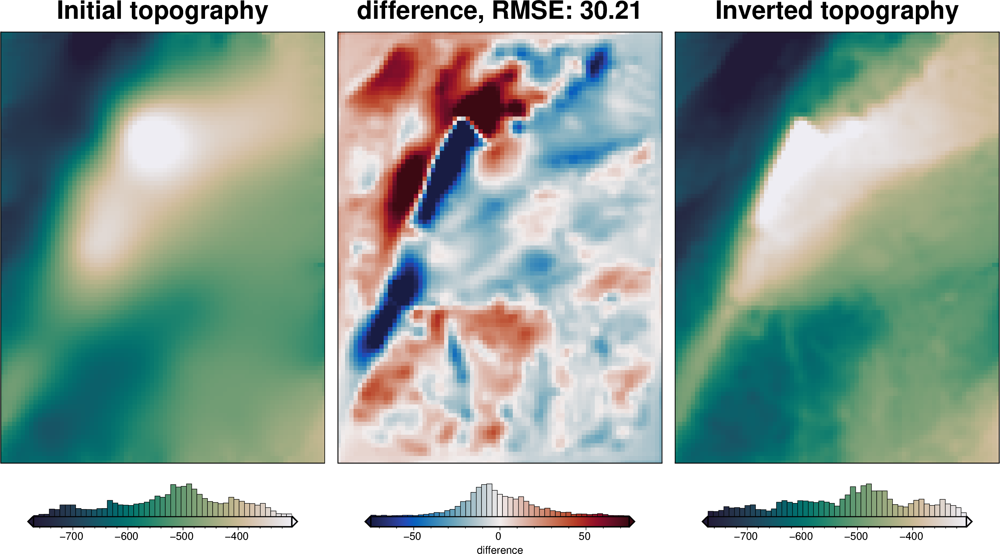

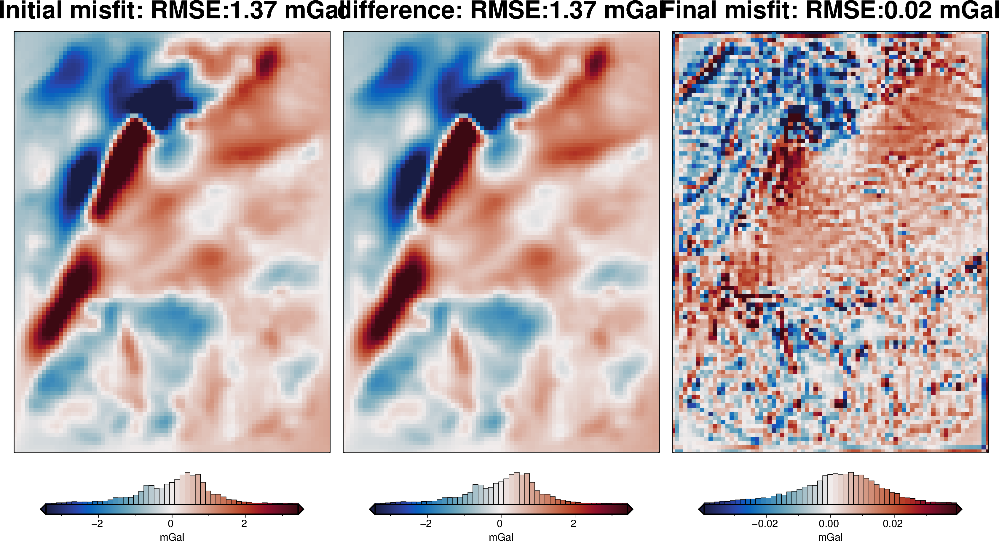

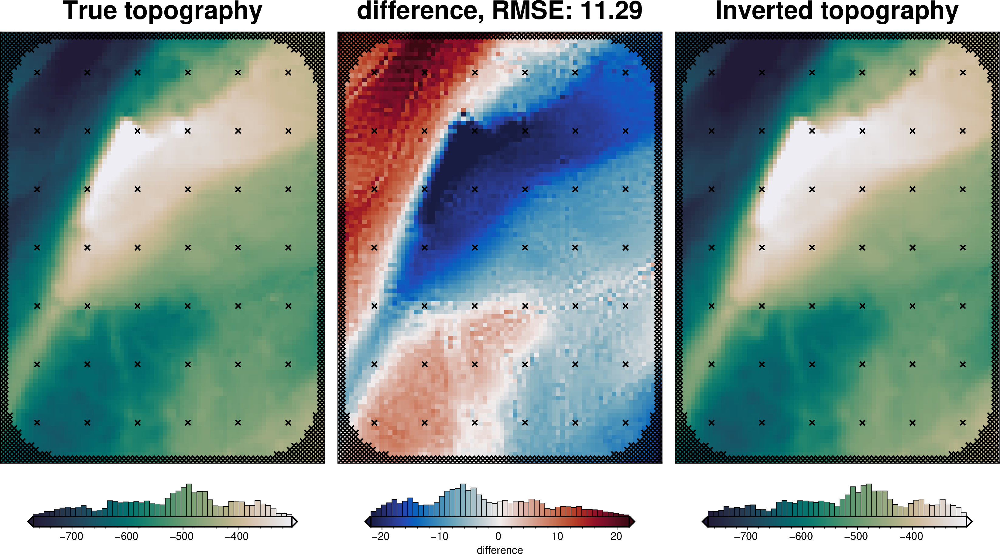

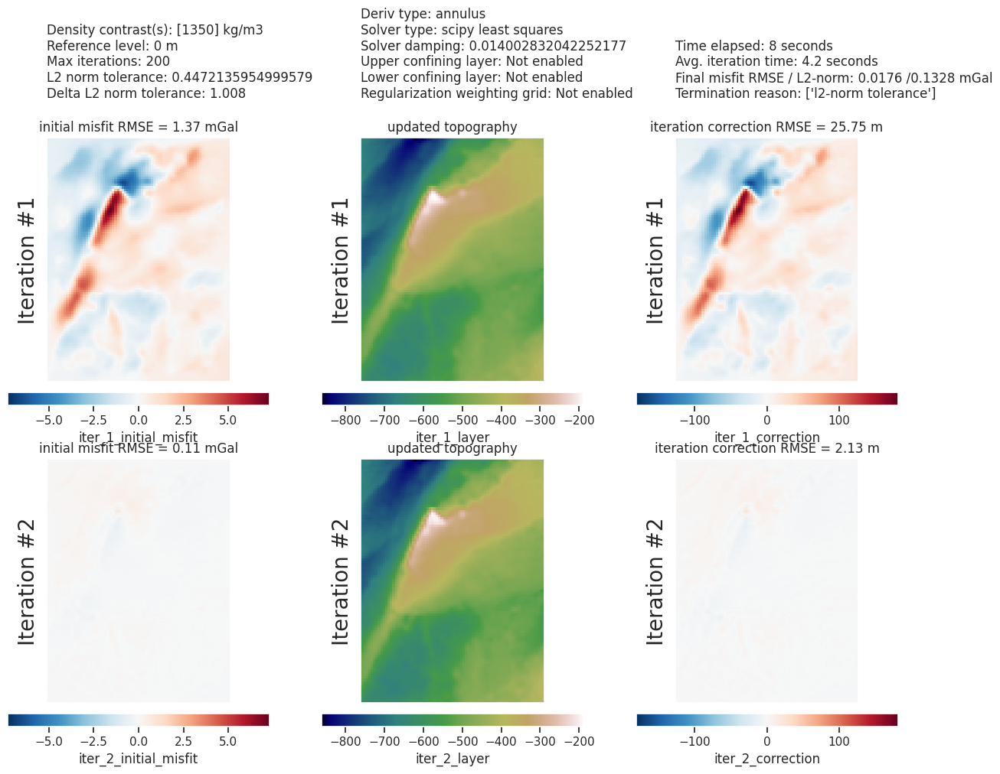

In [28]:
study_df = study.trials_dataframe()

plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)

plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)

In [29]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 12.25 m


# Density CV

In [30]:
# kwargs_no_weight = copy.deepcopy(kwargs)
# kwargs_no_weight["apply_weighting_grid"] = False
# kwargs_no_weight["weighting_grid"] = None

In [31]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_topography=starting_bathymetry,
    zref=0,
    calculate_regional_misfit=True,
    # regional_grav_kwargs=regional_grav_kwargs,
    regional_grav_kwargs=dict(
        grav_df=grav_df,
        method="constant",
        constant=0,
    ),
    run_zref_or_density_cv=True,
    constraints_df=constraint_points,
    density_contrast_limits=(1000, 2400),
    zref_density_cv_trials=10,
    # plot_cv=True,
    fname=f"{fpath}_density_cv",
    **kwargs,
)

INFO:invert4geom:saving all results with root name '../results/Ross_Sea_01_density_cv'
INFO:invert4geom:running zref and/or density contrast cross validation
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 7
INFO:invert4geom:	parameter: {'density_contrast': 1480}
INFO:invert4geom:	scores: [3.4545459393163807]
INFO:invert4geom:results saved to ../results/Ross_Sea_01_density_cv_results.pickle


In [32]:
# load saved inversion results
with pathlib.Path(f"{fpath}_density_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results


# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

In [33]:
best_density_contrast = study.best_params["density_contrast"]
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)

optimal determined density contrast 1480
real density contrast 1476


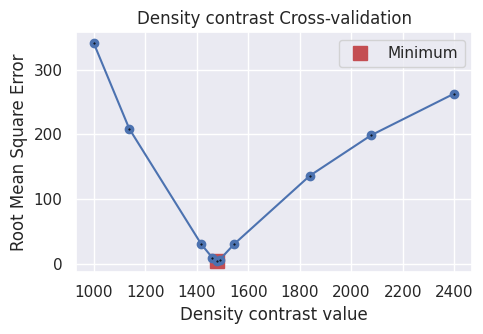

In [34]:
study_df = study.trials_dataframe()

fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_density_contrast,
    param_name="Density contrast",
)

### Redo with optimal density contrast
During the density cross-validation to avoid biasing the scores, we had to manually set a regional field. Now, with the optimal density contrast value found, we can rerun the inversion with an automatically determined regional field strength (the average value misfit at the constraints).

In [35]:
density_contrast = best_density_contrast

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

  0%|          | 0/7676 [00:00<?, ?it/s]

INFO:invert4geom:using median gravity misfit of constraint points for regional field: 0.042024025693535805 mGal


makecpt [ERROR]: Option T: min >= max


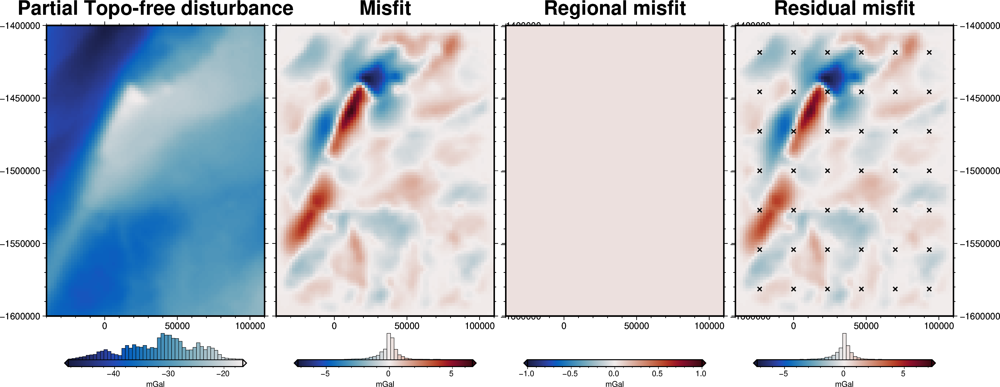

In [36]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

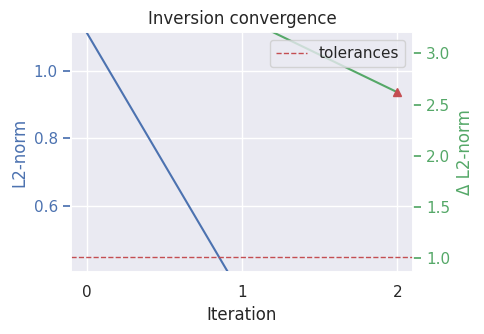

In [37]:
# run the inversion workflow
inversion_results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    fname=f"{fpath}_optimal",
    starting_prisms=starting_prisms,
    plot_dynamic_convergence=True,
    **kwargs,
)

In [38]:
# load saved inversion results
with pathlib.Path(f"{fpath}_optimal_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

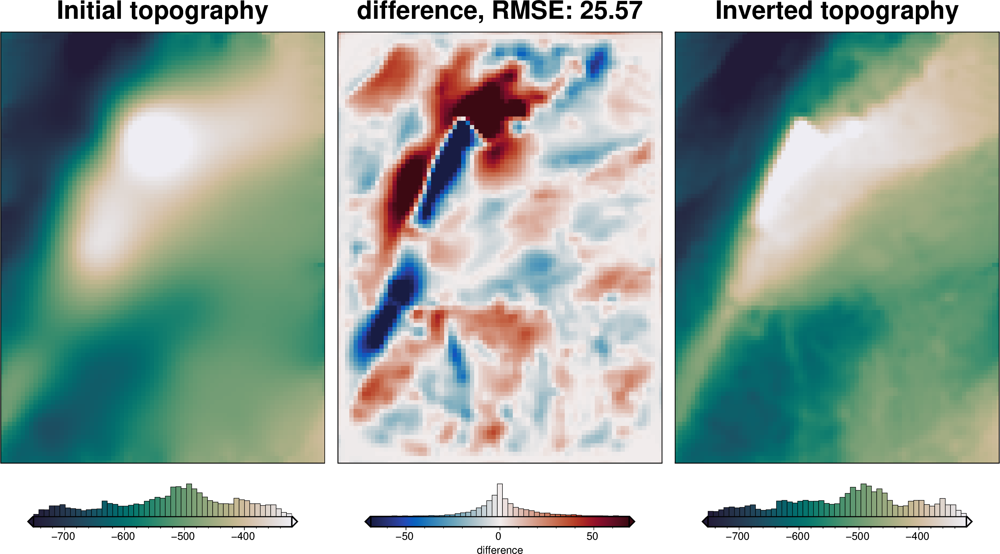

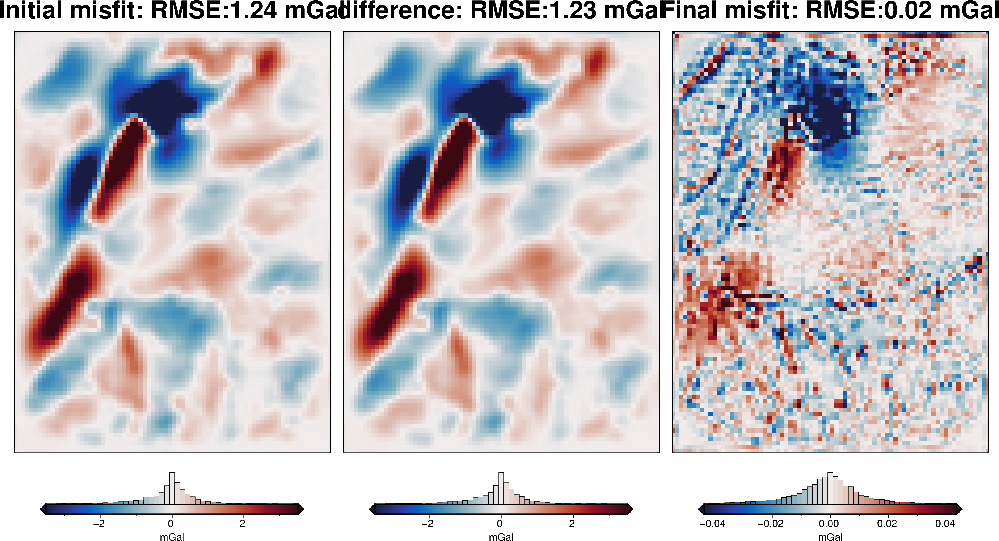

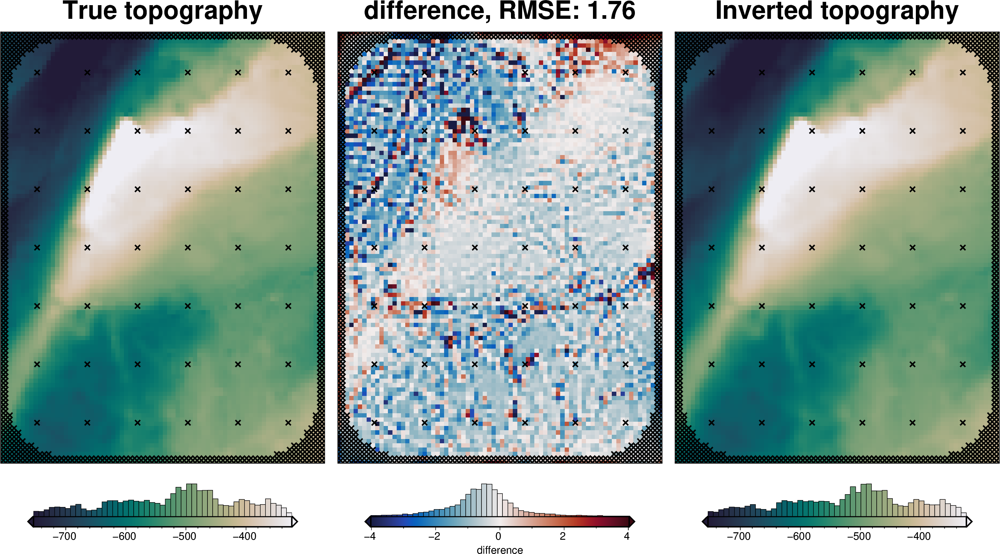

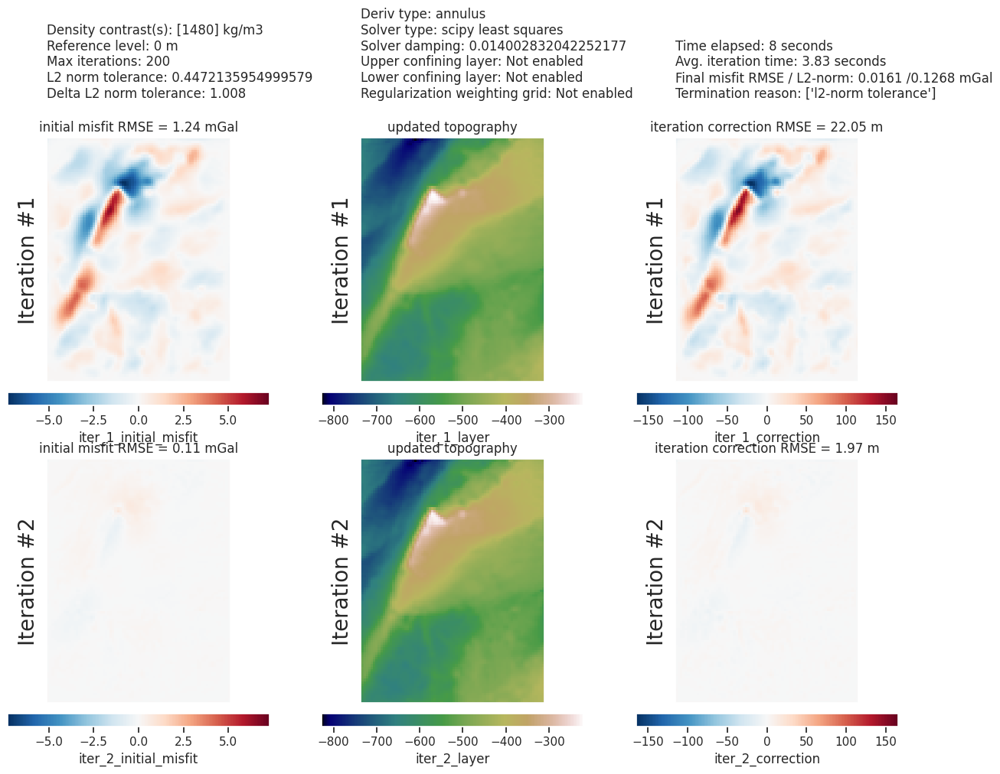

In [39]:
plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points,
    points_style="x.2c",
)

In [40]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 3.38 m


In [41]:
# save to csv
constraint_points.to_csv(f"{fpath}_constraint_points.csv", index=False)

# Uncertainty analysis

## Inversion error

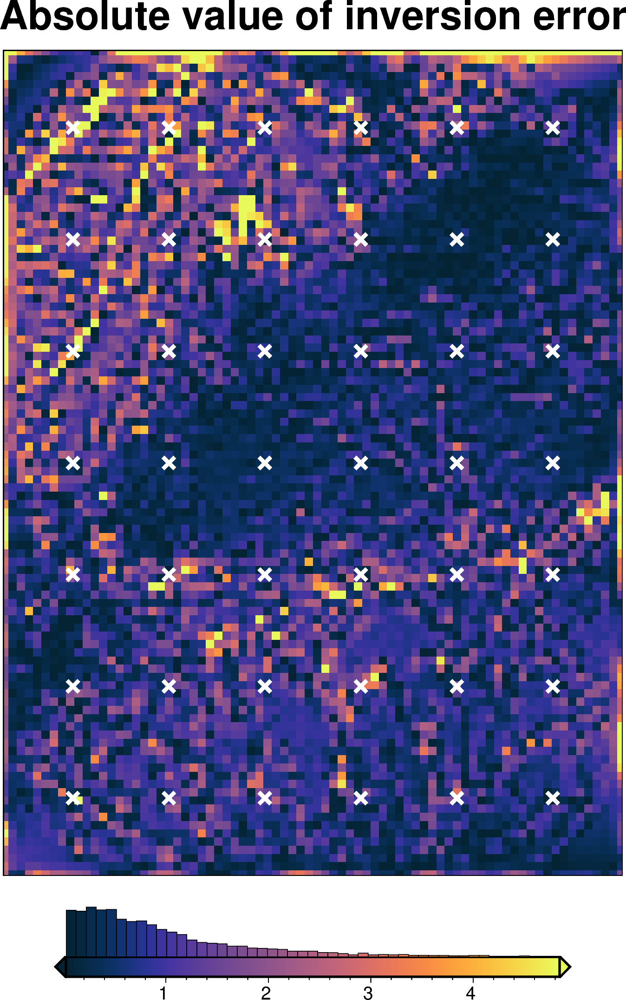

In [42]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    # region=vd.pad_region(inversion_region, -3*spacing),
    region=inversion_region,
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points[constraint_points.inside],
    points_style="x.3c",
    points_fill="white",
    points_pen="2p",
)
fig.show()

In [43]:
# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=regional_grav_kwargs,
    **kwargs,
)

## Solver damping component

In [44]:
# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
stdev = stdev / 2
print(f"using stdev: {stdev}")

calculated stdev: 0.4887398202712642
using stdev: 0.2443699101356321


best: 0.014002832042252177 
std: 0.2443699101356321 
+1std: 0.024580221368640583 
-1std: 0.007977117140762695


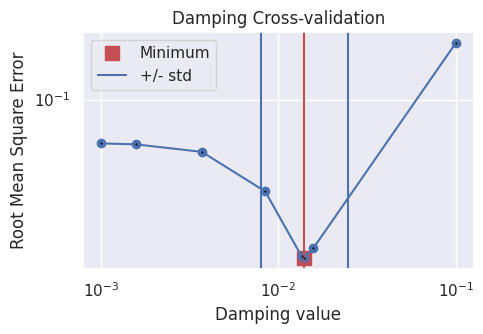

In [45]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.016057534934936918, min: 0.005549618722699614, max: 0.035332031802743635
INFO:invert4geom:all 10 runs already complete, loading results from files.


stochastic ensemble: 0it [00:00, ?it/s]

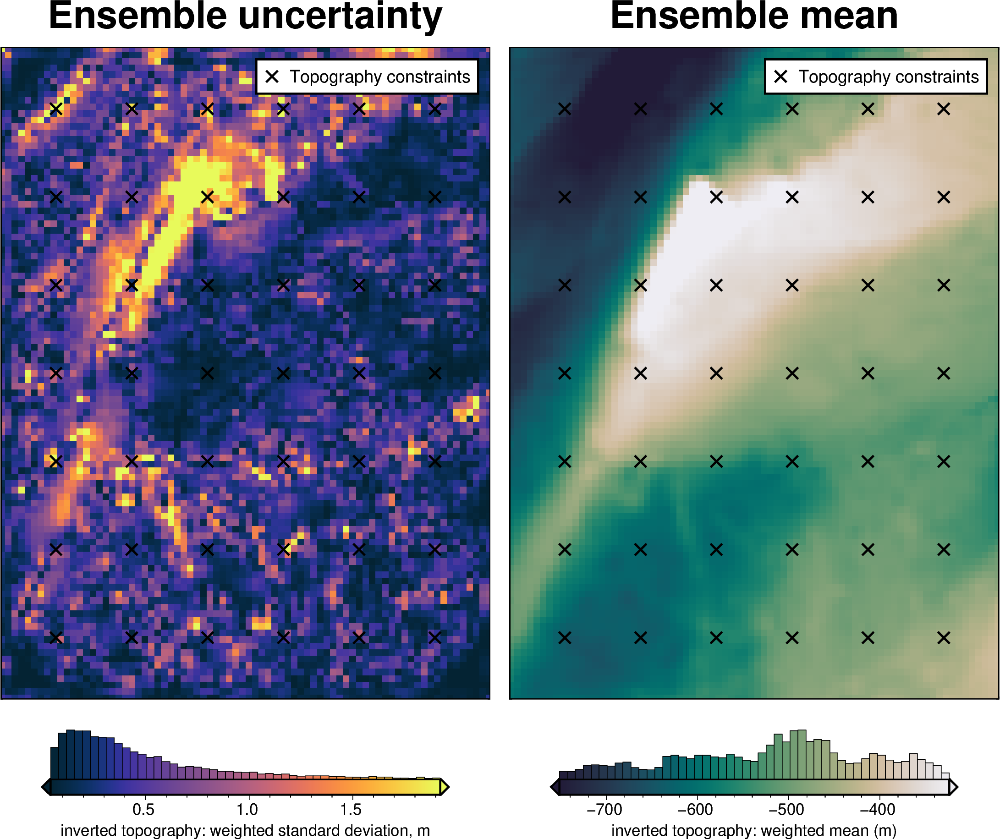

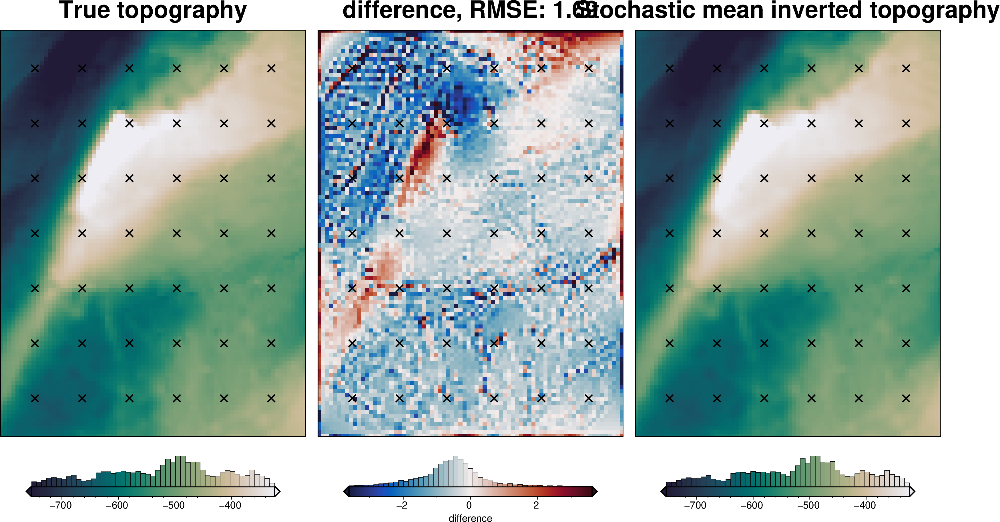

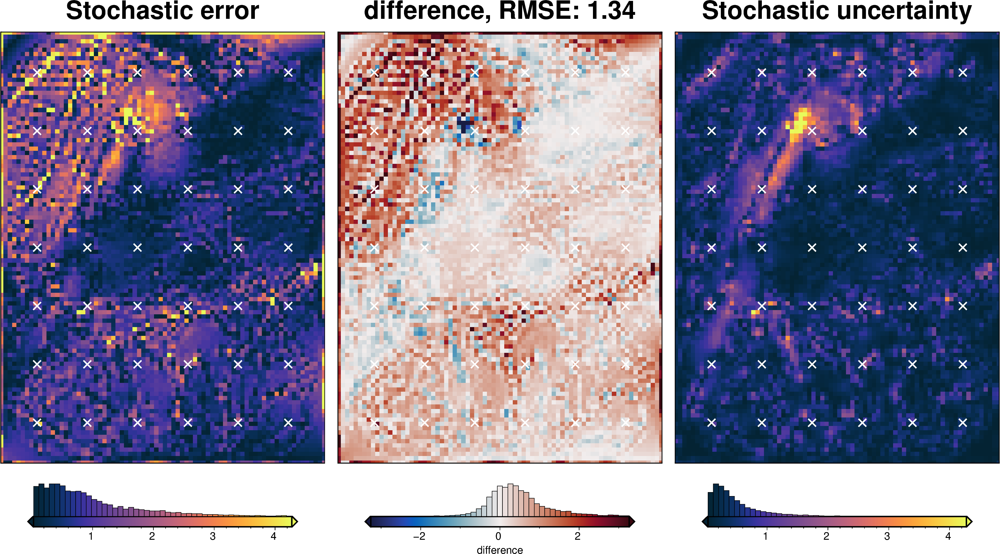

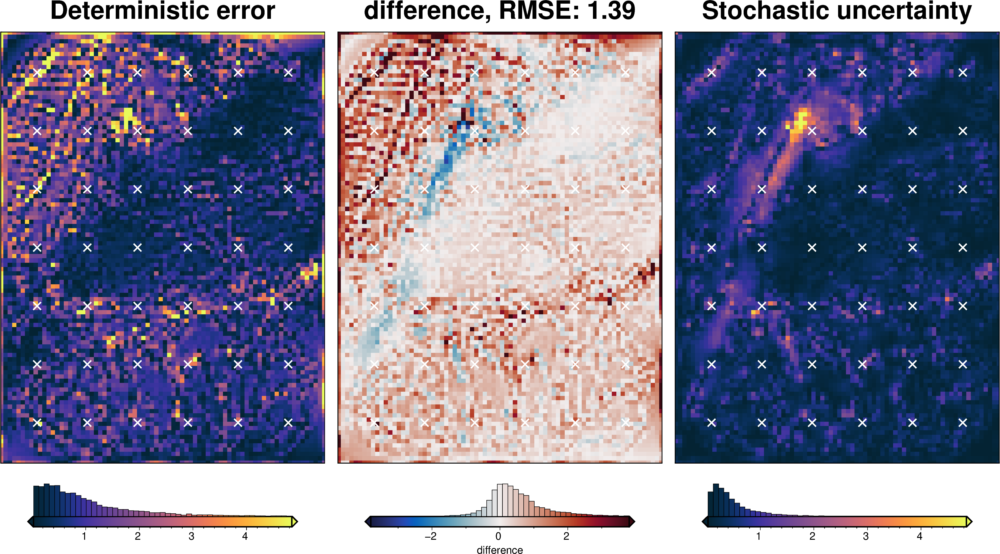

In [ ]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(best_damping),  # mean of base 10 exponent
        "scale": stdev,  # standard deviation of base 10 exponent
        "log": True,
    },
}
fname = f"{fpath}_uncertainty_damping_test"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_damping_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Density component

In [50]:
# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
stdev = 5
print(f"using stdev: {stdev}")

print(
    f"density estimation error: {np.abs(true_density_contrast - best_density_contrast)}"
)

calculated stdev: 418.74337142349026
using stdev: 5
density estimation error: 4


best: 1480 
std: 5 
+1std: 1485 
-1std: 1475


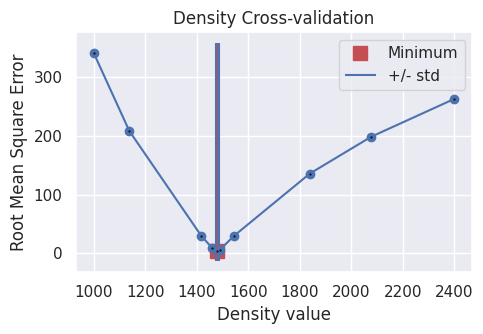

In [51]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.values,
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1480.0, min: 1471.7757318652427, max: 1488.2242681347573
INFO:invert4geom:No pickle files starting with '../results/Ross_Sea_01_uncertainty_density' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../results/Ross_Sea_01_uncertainty_density'



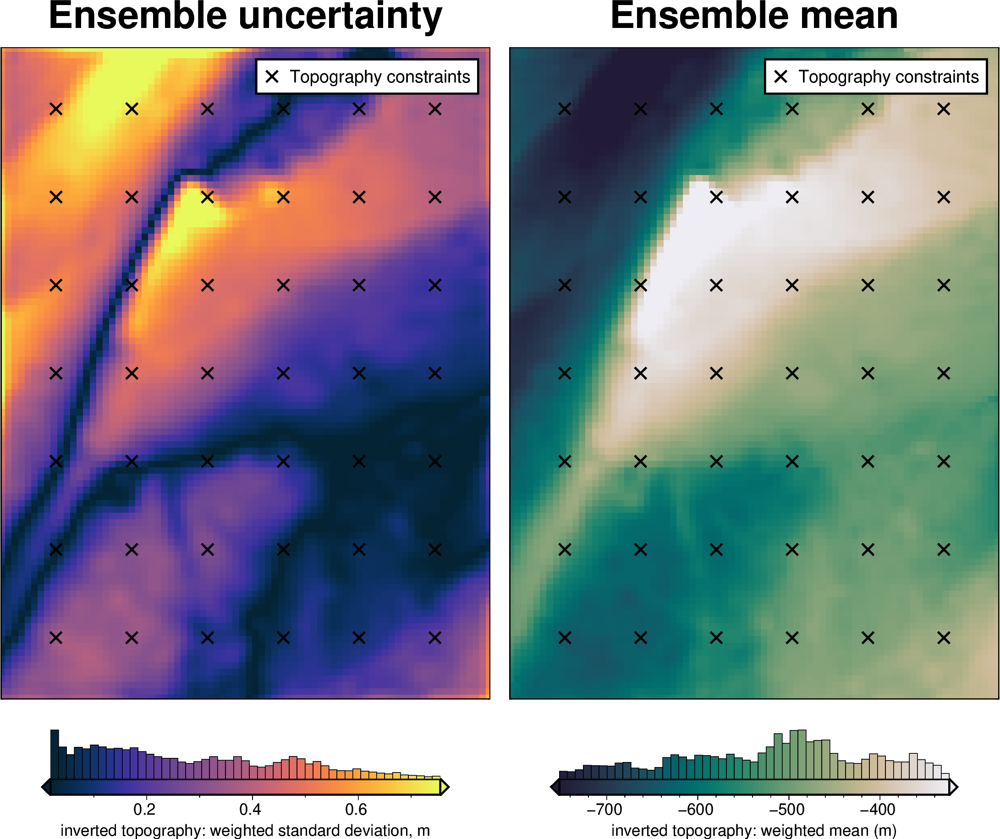

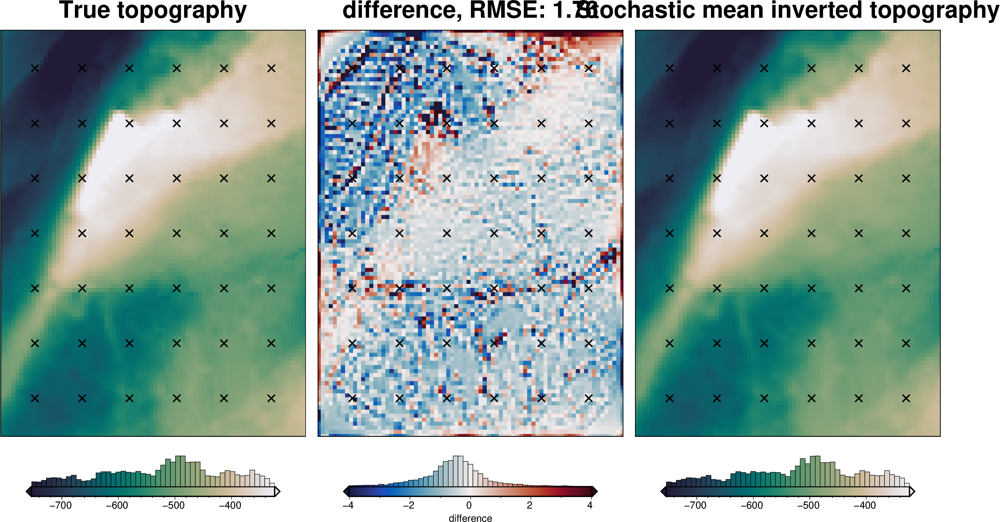

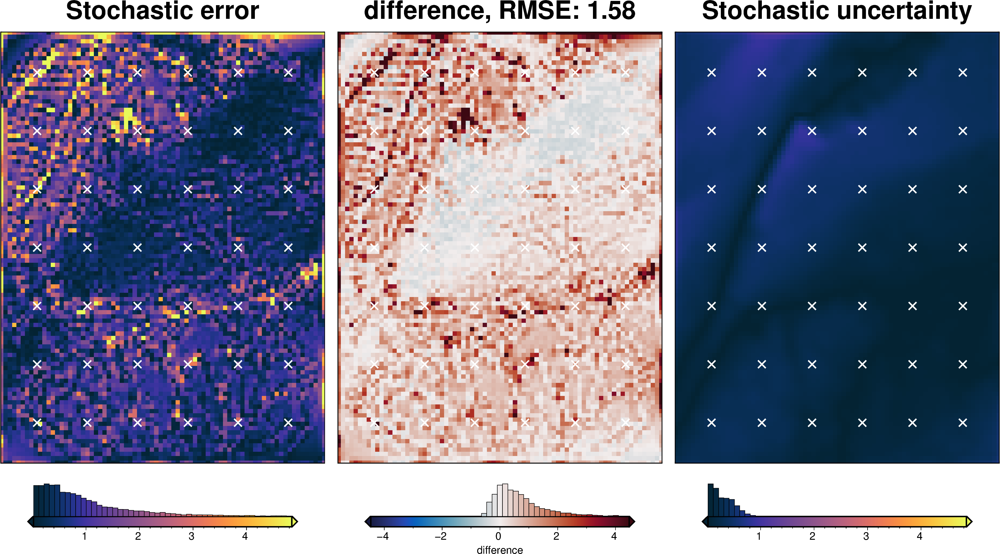

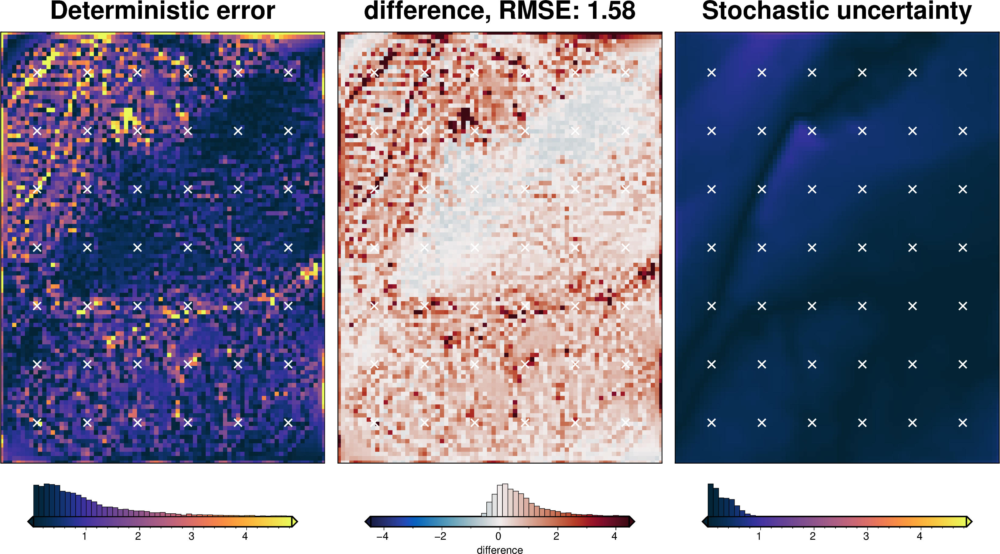

In [ ]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = f"{fpath}_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_density_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Total uncertainty

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.016216785638185575, min: 0.004647930836372652, max: 0.04218636466556139
INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1479.9999999999998, min: 1470.2001800772998, max: 1489.7998199227002
INFO:invert4geom:No pickle files starting with '../results/Ross_Sea_01_uncertainty_full_test' found, creating new files



stochastic ensemble:   0%|          | 0/20 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 20
saving results to pickle files with prefix: '../results/Ross_Sea_01_uncertainty_full_test'



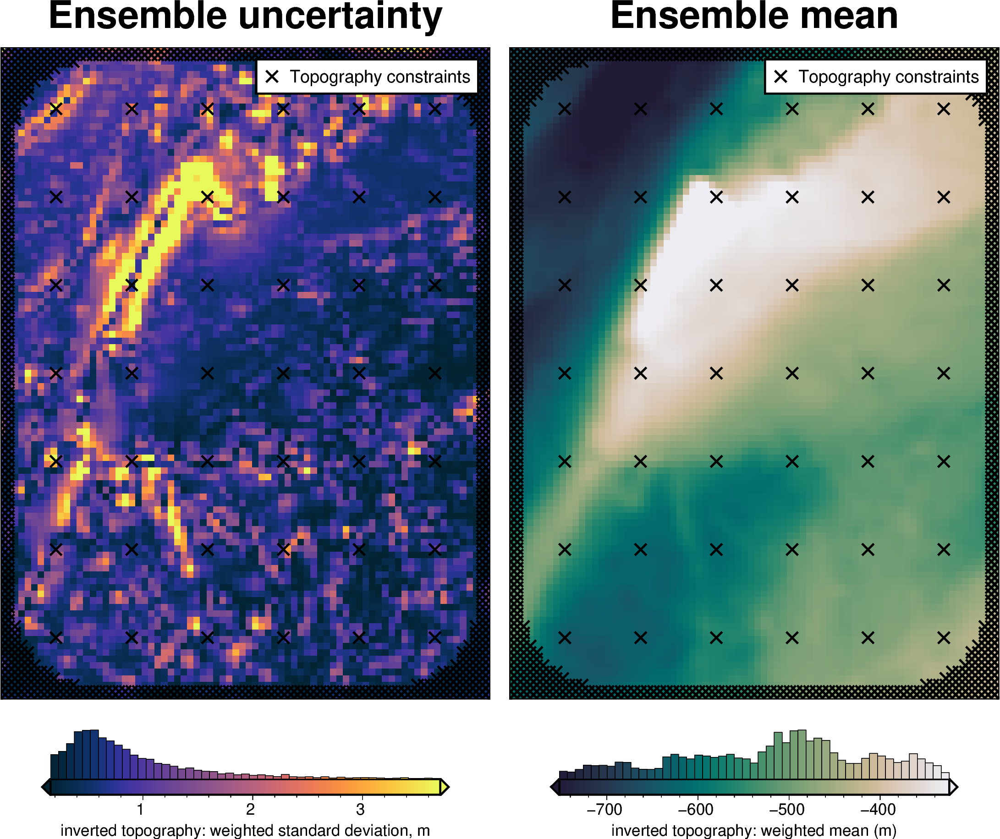

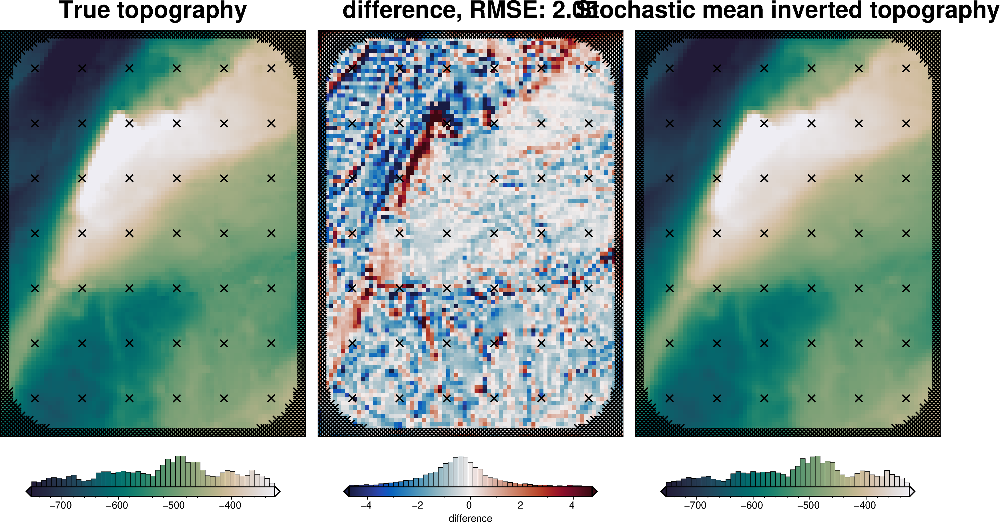

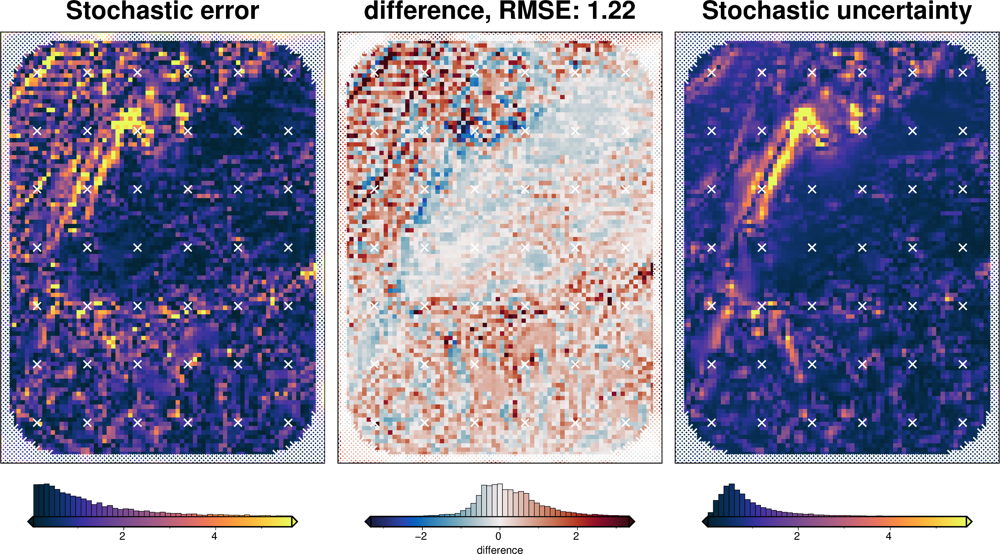

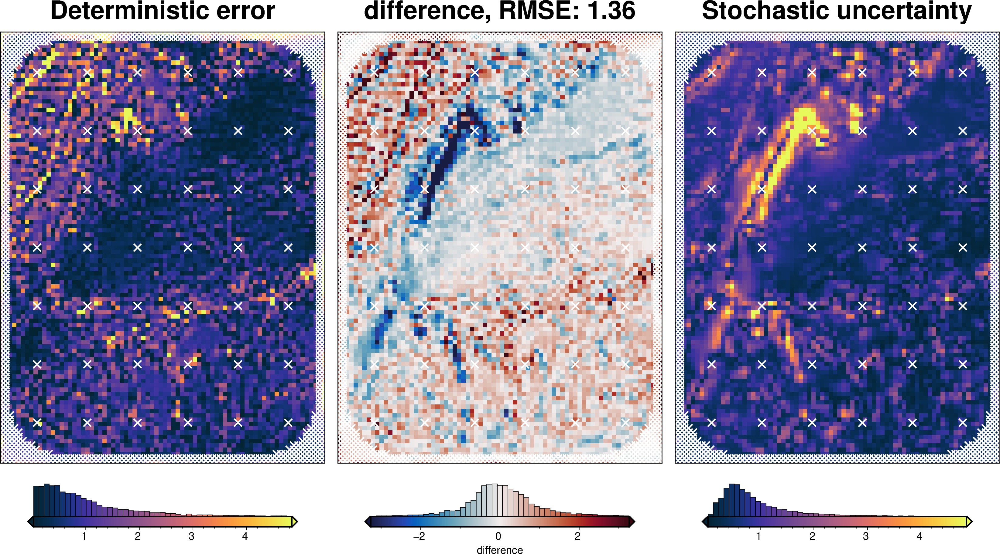

In [ ]:
fname = f"{fpath}_uncertainty_full_test"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    parameter_dict=solver_dict | density_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

### Comparing results

In [54]:
results = [
    uncert_results,
    uncert_density_results,
    uncert_damping_results,
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        # region=vd.pad_region(inversion_region, -3*spacing),
        region=inversion_region,
    )
    stats.append(ds)

In [55]:
names = [
    "full",
    "density",
    "damping",
]

# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 186kB
Dimensions:        (northing: 101, easting: 76)
Coordinates:
  * northing       (northing) float64 808B -1.6e+06 -1.598e+06 ... -1.4e+06
  * easting        (easting) float64 608B -4e+04 -3.8e+04 ... 1.08e+05 1.1e+05
Data variables:
    full_stdev     (northing, easting) float64 61kB 0.6599 0.5757 ... 1.604
    density_stdev  (northing, easting) float64 61kB 0.3367 0.344 ... 0.5002
    damping_stdev  (northing, easting) float64 61kB 0.6765 0.4011 ... 1.705

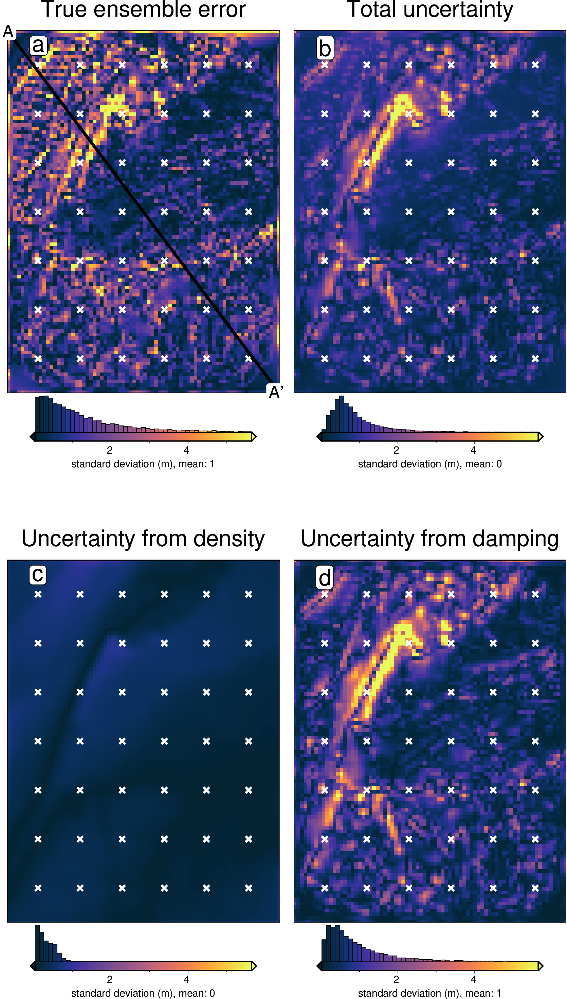

In [56]:
titles = [
    "True ensemble error",
    # "True indiv error",
    "Total uncertainty",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

# cpt_lims = polar_utils.get_min_max(grids[0], robust=True,)
cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 2:
        origin_shift = "both_shift"
        xshift_amount = -1
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

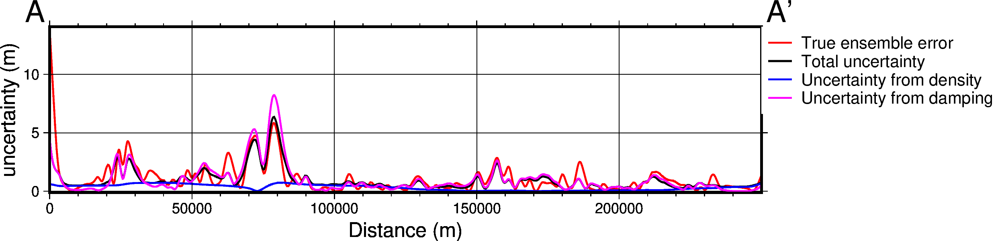

In [57]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    # data_pen_thickness=[1, 1.5, 1],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

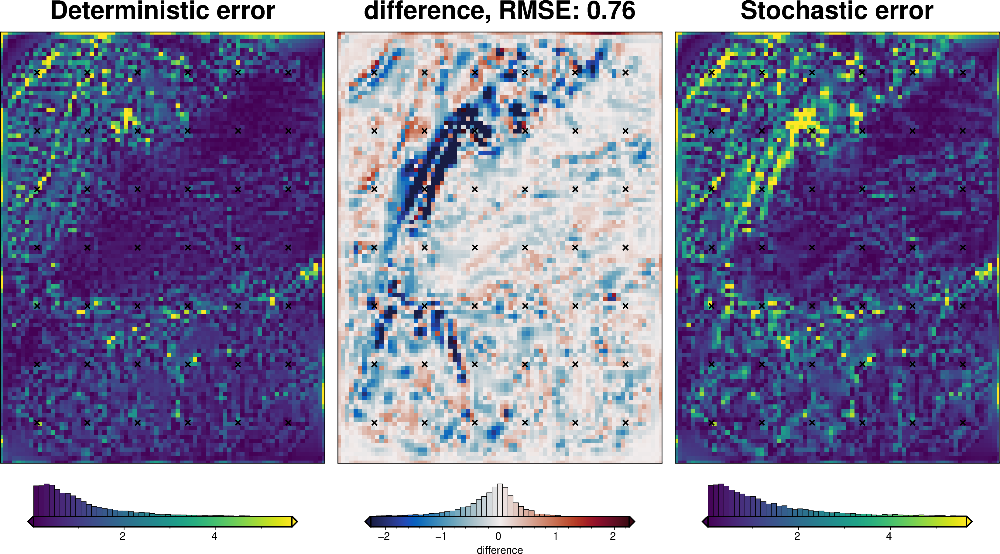

In [58]:
_ = polar_utils.grd_compare(
    inversion_error,
    np.abs(stats[0].weighted_mean - bathymetry),
    region=inversion_region,
    plot=True,
    grid1_name="Deterministic error",
    grid2_name="Stochastic error",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [59]:
# save results
merged.to_netcdf(f"{fpath}_sensitivity.nc")

In [60]:
stats_ds.to_netcdf(f"{fpath}_uncertainty.nc")